## SOLA

 - `SOLA`: "High Quality Time-Scale Modification for Speech"
 - `LSEE-MSTFM`: D.W. Griffin and J.S. Lim, '"Signal Estimation from Modified Short—Time Fourier Transform"
IEEE Trans. Acoust., Speech Signal Processing, Vol. ASSP—32, No. 2, April
1984, pp. 236—243.

`SOLA` is based on `LSEE-MSTFM`

## LSEE-MSTFM

In MSTFTM (Modified STFT-Magnitude) framework, STFT magnitude can be stretched(interpolated) in time domain easily, we want to recover time-domain signal from it which is expected to be also stretched in time but pitch/formants-preserved.

As said in the paper, the stretched (or any given) STFT spectrogram function $Y_w(mS, \omega)$ usually is not a valid STFT, because in any 2 window adjacent in time,  $Y_w(mS, \omega)$ $Y_w((m+1)S, \omega)$ each by itself definitly is a valid FFT spectrum, but if we apply IFFT on them and got 2 overlapping windowed signal:
$$
    y_w(mS,l)=w(mS-l)x(l) \\
    y_w((m+1)S,l)=w((m+1)S-l)x(l)
$$

it's highly possible that the overlapping part is not consistent:

$$
    \frac{y_w(mS,l)}{w(mS-l)} \neq \frac{y_w((m+1)S,l)}{w((m+1)S-l)}
$$

### Least square estimation (LSE)

The best guess of value $x[l]$ in LSE sense is the one that minimize the square distances between expected yw and observed yw of all STFT window containing time step l:
$$
    D = \sum_{m} (w[mS-l]x[l] - y_w(mS,l))^2
$$

since it has no upper bound, the minimum should happed at derivative zero point:

$$
\begin{align*}
  \frac{\partial{D}}{\partial{x[l]}} &= \sum_{m} 2(w[mS-l]x[l] - y_w(mS,l)) w[mS-l] \\
                             &= 2 x[l] \sum_{m} w[mS-l]^{2} - 2 \sum_{m} w[mS-l] y_w(mS,l) \\
                             &= 0
\end{align*}
$$

so we have:
$$
\begin{align*}
x[l] &= \frac{\sum_{m} w[mS-l] y_w(mS,l)}{\sum_{m} w[mS-l]^{2}} \\
     &= \sum_{m} (\frac{w[mS-l]}{\sum_{m} w[mS-l]^{2}}) y_w(mS,l)
\end{align*}
$$

Above equation is essentially weighted average of all reconstructed windowed signal containing time step l, or in a nother words, overlapping add (OLA) of weighted windowed reconstructed signal.

This equation is still used in SOLA.

## SOLA

Phase vocoder can predict phases fairly well, so it's better method if we stick to STFT framework, but SOLA author comes up with another idea which finally removes the needs for STFT.

The idea is that, the voice signal's phase/magnitude will repeat it self with great similarity at regular interval, so instead of using fixed output hop size, we can detect the time step at which the phase is likely to repeating itself, as shown in SOLA paper's FIGURE 2(g), the source signal window is delayed by k(2) which:
 - is more aligned in phase with previous window FIGURE 2(f).
 - is little displaced from canonical position but still dominates the spectrum at canonical position.

The formula of SOLA has definition of 2D signal of successive windows:

$$
X_w(mS_s,n) := w(mS_s-n) y[n-m(S_s-S_a)]
$$

 - $y[n-m(S_s-S_a)]$ is actually the input signal y[n] shifted in time by $m(S_s-S_a)$ for m'th output window.
 - $X_w(mS_s,n)$ is a time domain signal with $n \in (-\infty, \infty)$ and because of the window function w, it's energy is concentrated/localized at $mS_s$, which means it's value is zero when n goes away from this center. 

Step2.a try to "synchronize" the 2D signal family with each other in time-increasing order, and it uses cross-correlation for that purpose. use k=(-130, -20) WHY?

Step2.b after all initial estimations are synchronized, use LSE to combine multiple estimates from multiple adjacent windows. (don't mind the symbol, basic idea is still LSE)

So essentially, SOLA is sample-based synthesizer which align/synchronize phases.

C:\Users\tingqian\AppData\Local\Temp\ipykernel_19076\1298761235.py:36: RuntimeWarning: invalid value encountered in double_scalars
  r = np.sum(xn*xw) / (xw2*np.sum(xn*xn))


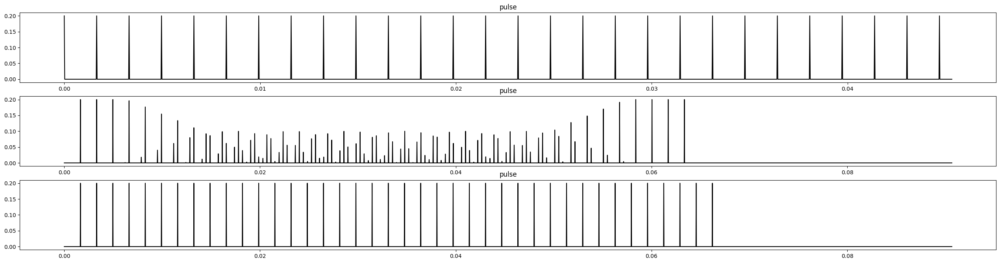

C:\Users\tingqian\AppData\Local\Temp\ipykernel_19076\1298761235.py:36: RuntimeWarning: invalid value encountered in double_scalars
  r = np.sum(xn*xw) / (xw2*np.sum(xn*xn))


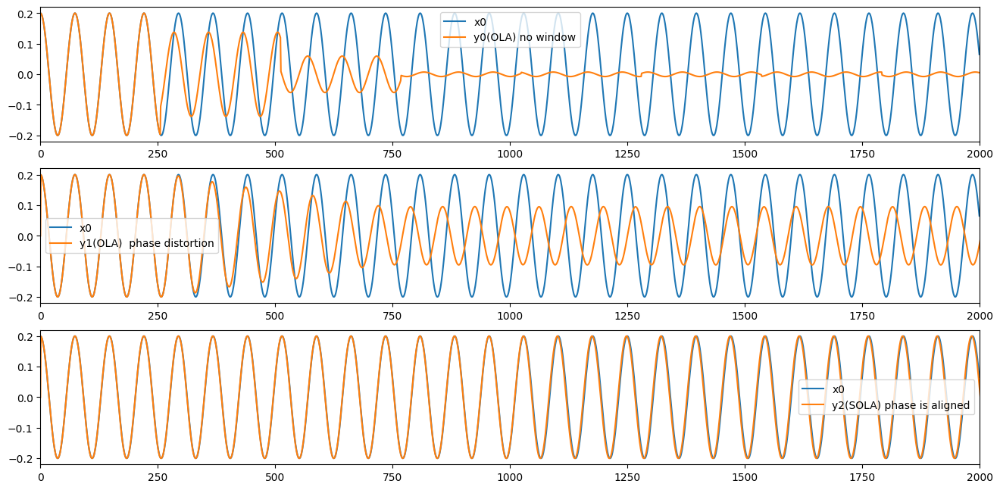

In [2]:
from scipy.fft import fft, ifft, fftfreq
from scipy import signal
import numpy as np
import IPython
import matplotlib.pyplot as plt
from vscode_audio import Audio
from lpc_helper import *
%matplotlib inline

# As defined in paper:
# input y
# output x
#
def SOLA_time_stretch(y, Sa, Ss, wnd_size=1024, krange = 300, ola_lse=False, use_wnd = True):
    if use_wnd:
        w = signal.windows.hann(wnd_size)
    else:
        w = np.ones([wnd_size])
    Ny = len(y)
    Nx = Ny*Ss//Sa
    x = np.zeros([Nx])
    c = np.zeros([Nx])
    i=k=0

    while(i < Ny-wnd_size and k < Nx-wnd_size):
        xw = y[i:i+wnd_size] * w
        # search near x[k] for best phase align
        if k == 0 or krange==0:
            p = k
        else:
            # synchronize xw with x
            xw2 = np.sum(xw*xw)
            rmax = 0
            for n in range(max(0,k-krange),k+krange):
                xn = x[n:n+wnd_size]
                r = np.sum(xn*xw) / (xw2*np.sum(xn*xn))
                if rmax < r:
                    p = n
                    rmax = r
        if ola_lse:
            x[p:p+wnd_size] += xw * w
            c[p:p+wnd_size] += w * w
        else:
            x[p:p+wnd_size] += xw
            c[p:p+wnd_size] += w

        i += Sa
        k += Ss
    c[c==0] = 1
    return x/c

fs=44100
wnd_size=1024
x = load_wave("wavs/m0.wav")

def cos_signal(fs, f, length=44100):
    t = np.arange(0, length)/fs
    return np.cos(2*np.pi*f*t) * 0.2

def pulse_signal(fs, f, length=44100):
    x = np.zeros([length])
    x[0::fs//f] = 0.2
    return x

#x = pulse_signal(fs, 200)
#x = cos_signal(fs, 200, fs)

x0 = pulse_signal(44100, 600, 2000)
y0 = SOLA_time_stretch(x0, 128, 256, krange=0)
y1 = SOLA_time_stretch(x0, 128, 256, krange=500)
play_sound([x0, y0, y1], rate=44100, name="pulse", spectrum=-1, waveform=1)

x0 = cos_signal(44100, 600, 2000)
y0 = SOLA_time_stretch(x0, 128, 256, krange=0, use_wnd=False)
y1 = SOLA_time_stretch(x0, 128, 256, krange=0)
y2 = SOLA_time_stretch(x0, 128, 256, krange=500)

plt.figure(figsize=(16,8), dpi= 100, facecolor='w', edgecolor='k')
plt.subplot(311)
plt.plot(x0,"-",label="x0")
plt.plot(y0,"-",label="y0(OLA) no window")
plt.xlim(0,2000)
plt.legend()

plt.subplot(312)
plt.plot(x0,"-",label="x0")
plt.plot(y1,"-",label="y1(OLA)  phase distortion")
plt.xlim(0,2000)
plt.legend()

plt.subplot(313)
plt.plot(x0,"-",label="x0")
plt.plot(y2,"-",label="y2(SOLA) phase is aligned")
plt.xlim(0,2000)
plt.legend()
plt.show()

play_sound(x, rate=fs, name="original", spectrum=-1, waveform=0)
play_sound(SOLA_time_stretch(x, 128, 256, krange=0), rate=fs, name="time stretched with OLA", spectrum=-1, waveform=0)
play_sound(SOLA_time_stretch(x, 128, 256, krange=200), rate=fs, name="time stretched with SOLA", spectrum=-1, waveform=0)

### Anaylyse of the test result

At shown in the cos-signal figure:

 - w/o using window, the phase mismatch introduces not only sudden change in phase, but also magnitude cancellation between predictions from adjacent/overlapping windows. 
 - using hann-window, the phase sudden change problem is mitigated, but still the magnitude is reduced since many predictions with mismatched phase. 
 - SOLA has no such problem, if the search can cover big enough range.